In [0]:
#Commands to remove old event files from the log directory in order to store new event files
#!rm -rf /tmp/GAN_Loss_SAGAN
#!rm -rf /tmp/D_Loss_Real_SAGAN
#!rm -rf /tmp/D_Loss_Fake_SAGAN

In [2]:
#Importing all import packages and methods
import numpy
import keras
from numpy import expand_dims,zeros,ones,vstack,cov,trace,iscomplexobj,asarray
from numpy.random import randn,randint,shuffle
from scipy.linalg import sqrtm
from keras.datasets.cifar10 import load_data
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense,Reshape,Flatten,Conv2D,Conv2DTranspose,LeakyReLU,Dropout, Layer, Concatenate, Embedding
from keras import backend as K
from keras.callbacks import TensorBoard
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from scipy.linalg import sqrtm
from skimage.transform import resize
from matplotlib import pyplot as plt
from SpectralNormalizationKeras import DenseSN, ConvSN2D, ConvSN2DTranspose
from keras.models import Model
from keras.utils.generic_utils import Progbar
from keras.engine import *
import tensorflow as tf
from SALayer import Attention

Using TensorFlow backend.


Discriminator Model:

In [0]:
# discriminator model
def define_discriminator(in_shape=(32,32,3)):                                    # Discriminator model defined using Sequential API of Keras
  model = Sequential()
  model.add(Conv2D(64, (3,3), padding='same', input_shape=in_shape))             # Normal Convolutional Layer
  model.add(LeakyReLU(alpha=0.2))
  model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))                   # COnvolutional Layer with stride 2x2
  model.add(LeakyReLU(alpha=0.2))
  model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Attention(128))                                                      # Attention Layer
  model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Flatten())                                                           # Flatten feature maps
  model.add(Dropout(0.4))                                                        # Dropout
  model.add(Dense(1, activation='sigmoid'))                                      # Output Layer with sigmoid activation function
  opt = Adam(lr=0.0002, beta_1=0.5)                                              # Adam optimizer with learning rate=0.0002
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy']) # Compiling model using binary cross entropy loss and Adam optimizer
  return model

Generator Model:

In [0]:
# generator model
def define_generator(latent_dim):                                                # Generator Model defined using Sequential API of Keras
  model = Sequential()
  n_nodes = 256 * 4 * 4
  model.add(Dense(n_nodes, input_dim=latent_dim))                                # Dense Layer with input as latent dimension
  model.add(LeakyReLU(alpha=0.2))
  model.add(Reshape((4, 4, 256)))
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))          # Convolutional Transpose Layer with stride 2x2
  model.add(LeakyReLU(alpha=0.2))
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Attention(128))                                                      # Attention Layer
  model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))                 # Output layer with tanh activation function
  opt = Adam(lr=0.0002, beta_1=0.5)                                              # Adam optimizer with learning rate=0.0002            
  model.compile(loss='binary_crossentropy',optimizer=opt)                        # Compiling model using binary cross entropy and Adam optimizer
  return model

GAN Model:

In [0]:
# GAN Model
def define_gan(g_model, d_model):                                                # GAN Model defined using Sequential API of Keras
  d_model.trainable = False                                                      # Setting False to not update discriminator
  model = Sequential()
  model.add(g_model)                                                             # Add Generator Model
  model.add(d_model)                                                             # Add Discriminator Model
  opt = Adam(lr=0.0002, beta_1=0.5)                                              # Adam Optimizer
  model.save_weights('model2_weights.h5')                                        # Saving weights of gan model
  model.compile(loss='binary_crossentropy', optimizer=opt)                       # Compiling model using binary cross entropy and Adam OPtimizer
  return model

Load Dataset and Generate Images:

In [0]:
# load dataset
def load_real_samples():                                                         # Method to load Images from CIFAR-10 dataset
  (X_train, _), (X_test, _) = load_data()                                        # Loading Test and train images from cifar-10 dataset
  Test_X=X_test.astype('float32')
  Test_X=(Test_X-127.5)/127.5                                                    # Normalize test images
  X = X_train.astype('float32')
  X = (X - 127.5) / 127.5                                                        # Normalize train images
  return X,Test_X

# selecting real samples
def generate_real_samples(dataset, numsamples):                                  # Method to take random real images
  index = randint(0, dataset.shape[0], numsamples)                               # Creating random indexes for number of samples in images
  X = dataset[index]                                                             # Assigning random indexes to images
  Y = ones((numsamples, 1))                                                      # Assigning output labels as 1 for Real Images to get Loss
  return X, Y                                                                    # Returning real images and output labels for discriminator

# random points for generator
def generate_latent_points(latent_dim, numsamples):                               # Method to create fake samples from latent dimension=100
  X_input = randn(latent_dim * numsamples)                                       # Generate points in latent space
  X_input = X_input.reshape(numsamples, latent_dim)                              # Reshaping in batch of number of samples
  return X_input                                                                 # Returning random input samples

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(gen_model, latent_dim, numsamples):                    # Method to generate fake images from latent points
  x_input = generate_latent_points(latent_dim, numsamples)                       # Getting Input points
  X = gen_model.predict(x_input)                                                 # Generating Input images using input points
  y = zeros((numsamples, 1))                                                     # Assigning output label as 0 for dicriminator to get Loss
  return X, y                                                                    # Returning Generated Input Images and Output Labels

Calculating FID Score:

In [0]:
def scale_images(images, new_shape):                                             # Helper Method to scale and resize every image
	images_list = list() 
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return asarray(images_list)

def calculate_fid(images1, images2):                                             # Method to calculate FID Score for 2 images
	images1 = images1.astype('float32')
	images2 = images2.astype('float32')
	# resize image
	images1 = scale_images(images1, (299,299,3))
	images2 = scale_images(images2, (299,299,3))
	#print('Scaled', images1.shape, images2.shape)
	# calculate activations
	model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))
	act1 = model.predict(images1, batch_size=1)
	act2 = model.predict(images2, batch_size=1)
	# calculate mean and covariance statistics
	mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
	mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
	# calculate sum squared difference between means
	ssdiff = numpy.sum((mu1 - mu2)**2.0)
	# calculate sqrt of product between cov
	covmean = sqrtm(sigma1.dot(sigma2))
	# check and correct imaginary numbers from sqrt
	if iscomplexobj(covmean):
		covmean = covmean.real
	# calculate score
	fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
	return fid

In [0]:
def plot_data(x,ax):                                                             # Helper method to plot data 
    ax.imshow((x+1)/2, cmap='gray') # to rescale from -1,1 to 0,

Training whole SAGAN Model:

In [0]:
# training generator and discriminator
def train(g_model, d_model, gan_model, dataset,test_dataset, latent_dim,D1,D2,G,fid,n_iterations=40000, n_batch=128):
	half_batch = int(n_batch / 2)
	for i in range(n_iterations):
      
		X_real, y_real = generate_real_samples(dataset, half_batch)                  # Calling method to generate Real Images
		d_loss_real= d_model.train_on_batch(X_real, y_real)                          # Method to train discriminator using real images and get loss values
      
		X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
		d_loss_fake= d_model.train_on_batch(X_fake, y_fake)                          # Method to train discriminator using fake images to get loss values
			
      
		X_gan = generate_latent_points(latent_dim, n_batch)
		y_gan = ones((n_batch, 1))                                                   # Assigning label=1 for fake samples in order to confuse discriminator
		g_loss = gan_model.train_on_batch(X_gan, y_gan)
			
		#print('>%d, g=%.3f' % (i+1,g_loss))
		if (i+1) % 1000 == 0:
			X_real_fid,y_real_fid=generate_real_samples(test_dataset,half_batch)       # Get real images from test dataset
			X_fake_fid,y_fake_fid=generate_fake_samples(g_model,latent_dim,half_batch)
			fid.append(calculate_fid(X_real_fid,X_fake_fid))                            # Calling method to calculcate fid score between real images from test dataset and fake images
			print(i+1)
		if (i+1) % 10000 == 0:	
			plt.figure(figsize=(10,10))
			plt.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.01, wspace=0.01)
			for j in range(64):
				ax=plt.subplot(8, 8, 1 + j)
				plt.axis('off')
				plot_data(X_fake[j], ax)                                                 # Plot Image grid 
			plt.savefig('sagan_generated_images_'+str(i+1)+'.png')
		D1.on_epoch_end(i, {"D_real_loss_sagan":d_loss_real[0]})
		D2.on_epoch_end(i, {"D_fake_loss_sagan":d_loss_fake[0]})
		G.on_epoch_end(i, {"SAGAN_loss":g_loss})
		gan_model.save('sagan_model.h5')                                             # Save Models
		g_model.save('sagan_g_model.h5')
		d_model.save('sagan_d_model.h5')

Main Code to call training method and record tensorboard events:




(1, 1, 128, 16)

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
(1, 1, 128, 16)






170500096/170498071 [==============================] - 11s 0us/step




/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'





87916544/87910968 [==============================] - 7s 0us/step
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000
30000
31000
32000
33000
34000
35000
36000
37000
38000
39000
40000


KeyboardInterrupt: ignored

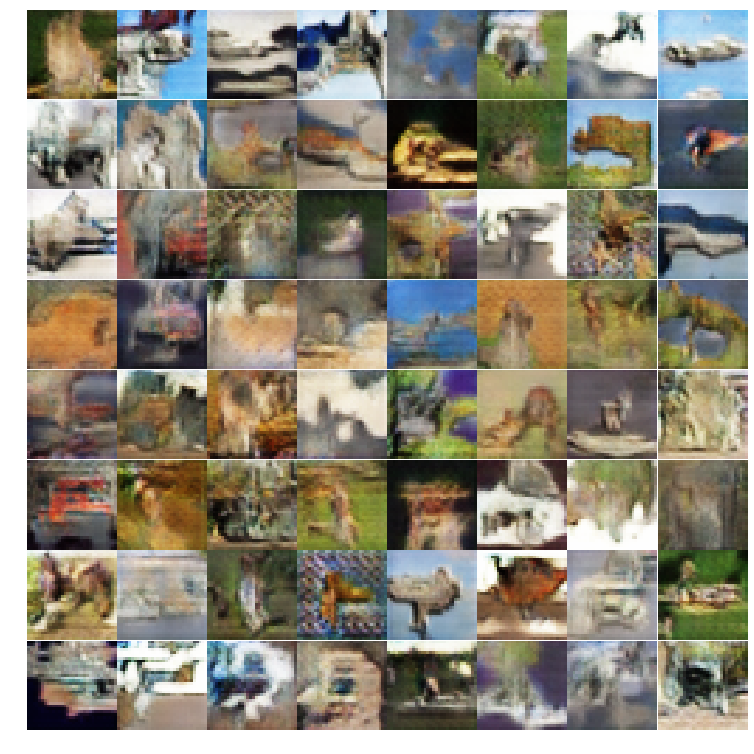

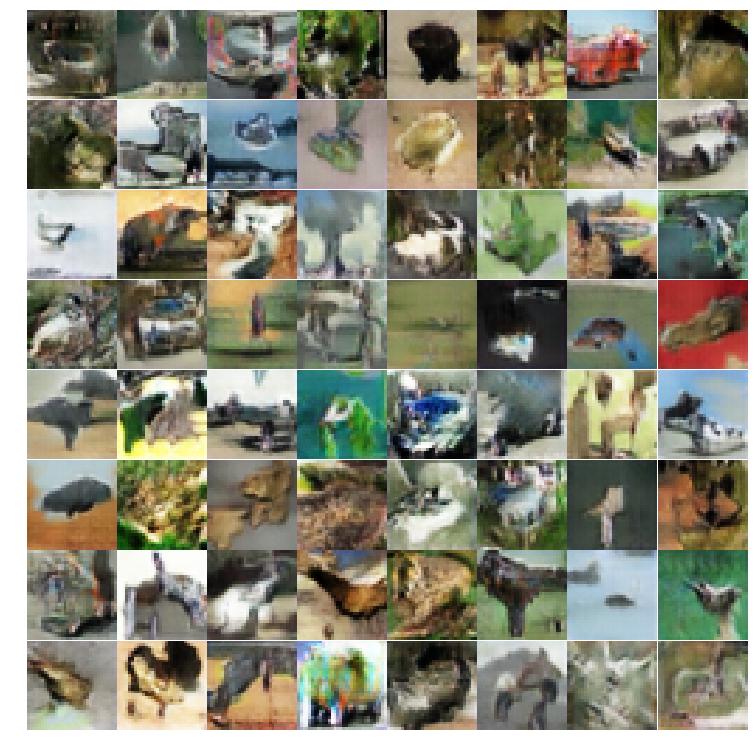

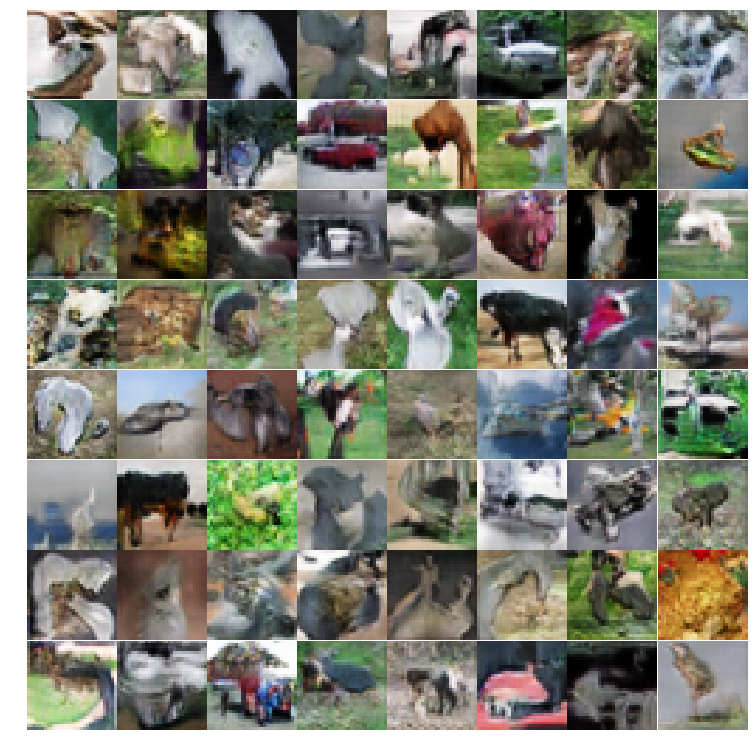

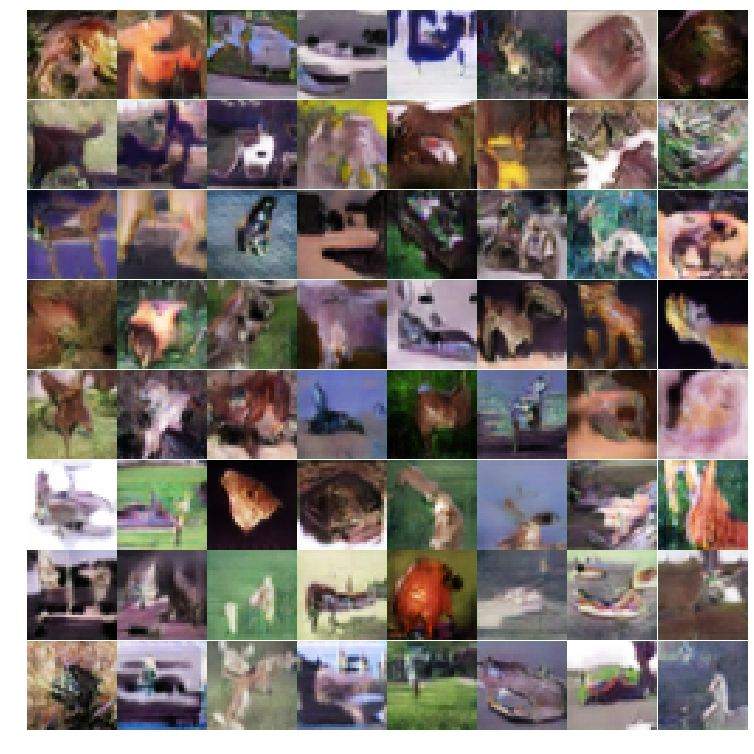

In [11]:
latent_dim = 100                                                                 # Size of the latent dimension

d_model = define_discriminator()                                                 # Calling method to create Discriminator model

g_model = define_generator(latent_dim)                                           # Calling method to create Generator Model

gan_model = define_gan(g_model, d_model)                                         # Calling method to create GAN MOdel

dataset,test_dataset = load_real_samples()                                       # Load Real images from cifar-10 dataset

#Set Tensorboard Callbacks
D1 = keras.callbacks.TensorBoard(log_dir='/tmp/D_Loss_Real_SAGAN',histogram_freq=0,write_graph=True,write_grads=True)
D1.set_model(d_model)
D2 = keras.callbacks.TensorBoard(log_dir='/tmp/D_Loss_Fake_SAGAN',histogram_freq=0,write_graph=True,write_grads=True)
D2.set_model(d_model)
G = keras.callbacks.TensorBoard(log_dir='/tmp/GAN_Loss_SAGAN',histogram_freq=0,write_graph=True,write_grads=True)
G.set_model(gan_model)
fid=[]
# training model
train(g_model, d_model, gan_model, dataset,test_dataset, latent_dim,D1,D2,G,fid) # Training all methods
gan_model.save('sagan_model.h5')                                                 # Saving all models
g_model.save('sagan_g_model.h5')
d_model.save('sagan_d_model.h5')
D1.on_train_end(None)
D2.on_train_end(None)
G.on_train_end(None)

Print FID Score:

In [12]:
print(fid)

[364.6812368246684, 267.5465101396443, 274.92310998522476, 268.90112053129326, 257.97698273576486, 245.36178321671778, 230.08745705192663, 252.08526961839328, 241.12266036612786, 247.6576486180286, 229.34970573171492, 235.68426983361957, 236.60895039362165, 235.4695572277384, 234.4678037929366, 241.28552811410802, 242.88109721643087, 238.17322593824605, 235.12051483100032, 237.50242167877474, 238.80047937191472, 235.796990792026, 252.7257736101821, 232.40759039750668, 238.23392681281277, 228.8075996060483, 244.83366840095175, 246.62305031436154, 236.31920950771814, 235.17138818090464, 244.9518525919255, 235.41598361980405, 240.50961760423183, 243.96554386117433, 235.93221661355986, 239.98756622911134, 235.71938363492717, 238.8138151924709, 246.40544032393933, 245.93058870881745]


Load Tensorboard and plot Discriminator Loss for Real Images:

In [13]:
%load_ext tensorboard
%tensorboard --logdir /tmp/D_Loss_Real_SAGAN

Plot Discriminator Loss for Fake Images:

In [14]:
%tensorboard --logdir /tmp/D_Loss_Fake_SAGAN

Plot GAN Loss:

In [15]:
%tensorboard --logdir /tmp/GAN_Loss_SAGAN

Plot FID Score:

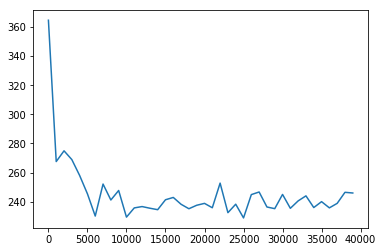

In [16]:
plt.plot([x for x in range(0,40000,1000)],fid)
plt.savefig('FID_Score_Plot')
plt.show()

Plot Final 8x8 Image Grid:

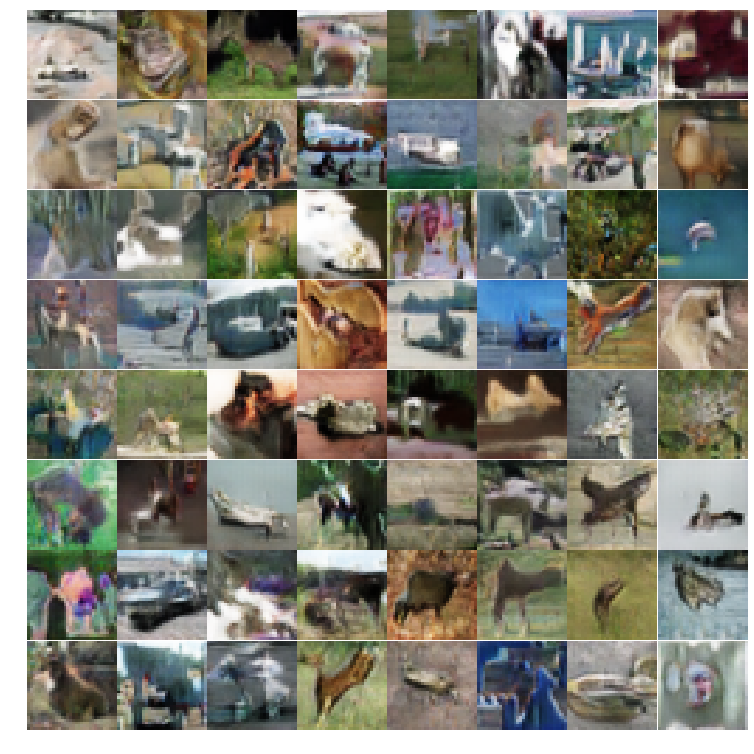

In [17]:
from keras.models import load_model
g_model=load_model('sagan_g_model.h5')
def plot_data(x,ax):
    ax.imshow((x+1)/2, cmap='gray') # to rescale from -1,1 to 0,

X_fake, y_fake = generate_fake_samples(g_model, latent_dim,100)
plt.figure(figsize=(10,10))
plt.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.01, wspace=0.01)
for i in range(64):
	ax=plt.subplot(8, 8, 1 + i)
	plt.axis('off')
	plot_data(X_fake[i], ax)
plt.savefig('final_generated_image.png')
plt.show()